1. [Открытие данных](#start)
    * [Вывод](#conclusion_od)
2. [Предобработка данных](#preprocessing)
    * [Обработка пропущенных значений](#null)
    * [Обработка дубликатов](#duplicates)
        * [Вывод](#conclusion_d)
    * [Поиск аномальных значений](#anomal)
        * [Вывод](#conclusion_a)
    * [Добавление столбцов](#add)
    * [Общий вывод по предобработке данных](#conclusion_preprocessing)
3. [Анализ данных](#analysis)
    * [Исследование 1: объекты общепита по категориям](#research_1)
        * [Вывод](#research_1_conc)
    * [Исследование 2: посадочные места](#research_2)
        * [Вывод](#research_2_conc)
    * [Исследование 3: сетевые и несетевые заведения](#research_3)
        * [Вывод](#research_3_conc)
    * [Исследование 4: ТОП-15 популярных заведений](#research_4)
        * [Вывод](#research_4_conc)
    * [Исследование 5: заведения общепита по районам](#research_5)
        * [Вывод](#research_5_conc)
    * [Исследование 6: средний рейтинг заведений](#research_6)
        * [Вывод](#research_6_conc)
    * [Построение карты со средним рейтингом заведений](#research_map)
        * [Вывод](#research_map_conc)
    * [Исследование 7: ТОП-15 улиц по количеству заведений](#research_7)
        * [Вывод](#research_7_conc)
    * [Исследование 8: медиана средних чеков по районам](#research_8)
        * [Вывод](#research_8_conc)
    * [Общий вывод](#conclusion_ad)
4. [Детализация исследования: открытие кофейни](#open_coffee)
    * [Вывод](#conclusion_coffee)
5. [Презентация](#power_point)

**Заголовок: Рынок заведений общественного питания Москвы.**

**Описание проекта:** 
В больших городах заведения общественного питания уже давно стали неотъемлемой частью культуры и современного облика города. Несмотря на то, что в Москве их открыто достаточное количество, этот бизнес продолжает расти и имеет огромный потенциал. Поэтому аналитическая работа в оценке привлекательности заведения и в выборе места может стать ключевым фактором успешного бизнес-стартапа. На основе данных сервисов Яндекс.Карты и Яндекс.Бизнес на лето 2022 года можно провести качественный анализ точек общественного питания города Москвы и выявить основные факторы для развития нового заведения.

**Цель исследования:**
изучить рынок заведений общественного питания Москвы, предложить инвесторам места для открытия кофейни.

**Ход исследования:** 

       * Подготовка данных - изучение предложенного датасета.
       * Предобработка данных - удаление явных и неявных дубликатов, устранение аномалий в данных, заполнение пропущенных значений, добавление необходимых столбцов.
       * Исследовательский анализ - изучение типов заведений, средних цен и рейтингов, распределение заведений по районам города, поиск закономерностей и аномалий.

**Общий вывод:**
резюмирование полученных результатов, формулировка выводов и рекомендаций инвесторам.


<a id = 'start'></a>
# 1. Открытие данных


In [36]:
#импортирую все необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster 

In [37]:
catering = pd.read_csv('/datasets/moscow_places.csv')
catering.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [38]:
catering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


<a id = 'conclusion_od'></a>
**Вывод:**

В датасете представлено 8406 заведений общественного питания в Москве. 

Типы данных в столбцах соответствуют указанным в них данным.

<a id = 'preprocessing'></a>
# 2. Предобработка данных


<a id = 'null'></a>
## Обработка пропущенных значений


В данных есть пропуски в следующих столбцах:
* hours - часы работы
* price - категория цен
* avg_bill - средняя стоимость заказа
* middle_avg_bill - число с оценкой среднего чека
* middle_coffee_cup - число с оценкой одной чашки капучино
* seats - количество посадочных мест

Изучив данные, мне кажется заполнить пропущенные значения ни в одном из столбцов какими-то логичными данными не получится (только если вручную искать информацию о каждом заведении), т.к. все они являются индивидуальными характеристиками заведения.

<a id = 'duplicates'></a>
## Обработка дубликатов


Удалю явные дубликаты, если они есть

In [39]:
catering.drop_duplicates().reset_index(drop = True)
catering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Посмотрю, как выглядит столбец с районами Москвы

In [40]:
catering['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Посмотрю, как выглядит столбец с адресами заведений

In [41]:
catering['address'].value_counts()

Москва, проспект Вернадского, 86В        28
Москва, Усачёва улица, 26                26
Москва, площадь Киевского Вокзала, 2     20
Москва, Ярцевская улица, 19              20
Москва, проспект Мира, 211к2             16
                                         ..
Москва, Ельнинская улица, 14, корп. 2     1
Москва, Ленинградское шоссе, 68           1
Москва, Большой Дровяной переулок, 6      1
Москва, Измайловский проспект, 61с2       1
Москва, Ермолаевский переулок, 7          1
Name: address, Length: 5753, dtype: int64

Видно, что с округами и адресами всё нормально. Проверю, нет ли дубликатов в столбце с названиями. Для этого сделаю все символы в названиях строчными, чтобы исключить дубликаты из-за регистра введенных наименований. 

In [42]:
catering['name'] = catering['name'].str.lower()
catering.drop_duplicates().reset_index(drop = True)
catering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


<a id = 'conclusion_d'></a>
**Вывод**

Явных дубликатов в данных нет.

Столбец с районами Москвы без ошибок. 

Столбец с адресами заведений выглядит адекватно.

Привела названия заведений к нижнему регистру. Эта процедура неявных дубликатов не выявила.

Удалений и изменений в данных не делаю.


<a id = 'anomal'></a>
## Поиск аномальных значений

Посмотрю, данные о заведениях с количеством посадочных мест более 500

In [8]:
c_sort = catering.loc[catering["seats"] >= 500].sort_values(by = 'seats', ascending = False)
c_sort.loc[:,["name","category","address",'seats']].head(50)

,name,category,address,seats
6684,пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",1288.0
6690,японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",1288.0
6658,гудбар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",1288.0
6771,точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",1288.0
6641,one price coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",1288.0
6807,loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",1288.0
6574,мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",1288.0
6524,ян примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",1288.0
6808,яндекс лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",1288.0
6518,delonixcafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",1288.0


<a id = 'conclusion_a'></a>
**Вывод**

С одной стороны, такое огромное число посадочных мест выглядит как аномальные значения, тем более с учетом того, что почти все указанные заведения находятся на разных адресах.

С другой стороны, если эта информация были добавлена пользователями, то тут возможны ошибки и неточности. Причем как в адресе, так и в числе посадочных мест.

Я изучила в интернете проспект Вернадского, Ленинградский проспект, шоссе Измайловское, Мичуринский проспект. По этим адресам или неподалеку есть крупные торговые центры, фудхоллы и т.п. Поэтому можно предположить, что адреса не точны, а количество посадочных мест указано общее на фудкорте.

Удалять эти данные я не буду, но исследование посадочных мест буду проводить с учетом этих аномальных значений.

<a id = 'add'></a>
## Добавление столбцов


Добавлю столбцы:
* street - с названиями улиц из столбца с адресом
* is_24_7 - со значениями True - если заведение работает ежедневно и круглосуточно, False - в противоположном случае
* district_short - с короткими названиями округов города Москвы для лаконичного отображения на графиках

In [9]:
catering['street'] = catering['address'].str.split(', ').str.get(1)

In [10]:
j = 0
for i in catering['hours']:
    if i == 'ежедневно, круглосуточно':
        catering.loc[j,'is_24_7'] = True
    else:
        catering.loc[j,'is_24_7'] = False
    j+=1  
    

In [11]:
j = 0
for i in catering['district']:
    if i == 'Северный административный округ':
        catering.loc[j,'district_short'] = 'Север'
    if i == 'Северо-Восточный административный округ':
        catering.loc[j,'district_short'] = 'Северо-Восток'
    if i == 'Северо-Западный административный округ':
        catering.loc[j,'district_short'] = 'Северо-Запад'
    if i == 'Западный административный округ':
        catering.loc[j,'district_short'] = 'Запад'
    if i == 'Центральный административный округ':
        catering.loc[j,'district_short'] = 'Центр'
    if i == 'Восточный административный округ':
        catering.loc[j,'district_short'] = 'Восток'
    if i == 'Юго-Восточный административный округ':
        catering.loc[j,'district_short'] = 'Юго-Восток'
    if i == 'Южный административный округ':
        catering.loc[j,'district_short'] = 'Юг'
    if i == 'Юго-Западный административный округ':
        catering.loc[j,'district_short'] = 'Юго-Запад'
    j+=1


<a id = 'conclusion_preprocessing'></a>
**Общий вывод по предобработке данных:**

* Пропуски в данных есть, но логически заполнить их нельзя, поэтому оставляю как есть.

* Явных и неявных дубликатов в данных нет.

* В столбце с данными о количестве посадочных мест есть подозрительно большие значения, но выявить явную ошибку невозможно - это или ошибка при введении данных, или число посадочных мест в большом торговом центре или фудхолле. Поэтому удалять их не буду, но учту это при работе со столбцом посадочных мест.

* Добавила столбцы:
    * street - с названиями улиц из столбца с адресом
    * is_24_7 - со значениями True - если заведение работает ежедневно и круглосуточно, False - в противоположном случае
    * district_short - с короткими названиями округов города Москвы для лаконичного отображения на графиках


<a id = 'analysis'></a>
# 3. Анализ данных


<a id = 'research_1'></a>
## Исследование 1

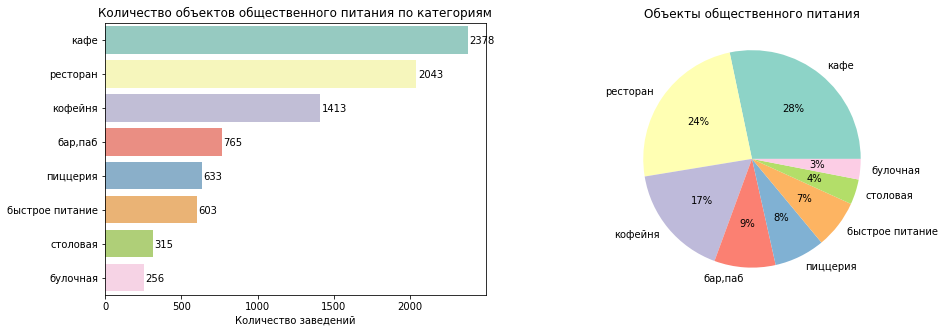

In [12]:
cc = catering.pivot_table(index = 'category', values = 'name', aggfunc = {'count'}). \
                                        sort_values(by = 'count', ascending = False).\
                                        reset_index()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
colors = sns.color_palette('Set3')

g = sns.barplot(data = cc, 
            x = 'count', 
            y = 'category',
            ax = fig.axes[0], 
            palette = colors)
g.set_xlabel('Количество заведений')
g.set_ylabel('')
g.set_title('Количество объектов общественного питания по категориям')

# добавим максимальные значения на график
xi = 0
j = 0
for i in range(0,8):
    xi = cc['count'].iloc[i]
    ax[0].text(x = xi + 10, y = 0.1 + j, s = f'{xi}')
    j+=1


cc.plot(kind = 'pie', y = 'count', 
       ylabel = '', 
       labels = cc['category'], 
       colors = colors, 
       legend = False, 
       autopct='%.0f%%',
       ax = fig.axes[1],
       title = 'Объекты общественного питания')
plt.show()

<a id = 'research_1_conc'></a>
**Вывод**

В Москве больше всего кафе (28% от числа точек общепита), так же немало ресторанов (24%) и кофеен (17%).

Немного баров, пиццерий и точек быстрого питания (9%, 8% и 7% соответственно).

Меньше всего столовых и булочных (4% и 3% соответственно)

<a id = 'research_2'></a>
## Исследование 2

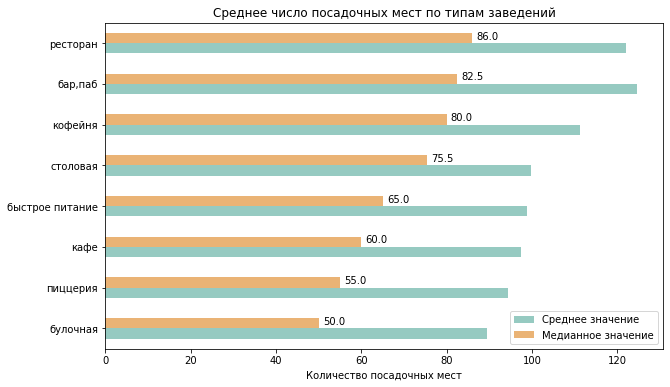

In [13]:
cs = catering.pivot_table(index = 'category', \
                          values = 'seats', \
                          aggfunc = {'mean','median'}).\
                    sort_values(by = 'median'). \
                    reset_index()

s = cs.set_index('category').plot.barh(
            title = 'Среднее число посадочных мест по типам заведений',
            figsize = (10,6), color = ['#96cac1','#eab375'])       
plt.xlabel('Количество посадочных мест')
plt.ylabel('')
plt.legend(['Среднее значение','Медианное значение'])

# добавим медианные значения на график
xi = 0
j=0
for i in range(0,8):
    xi = cs['median'].iloc[i]
    s.text(x = xi+1, y = 0.1+j, s = f'{xi}')
    j+=1

<a id = 'research_2_conc'></a>
**Вывод**

Как уже было показано выше, среднее число посадочных мест гораздо выше из-за аномальных значений посадочных мест у некоторых заведений. Поэтому рассмотрим медианные значения.

Наибольшее медианное число посадочных мест у ресторанов, баров, кофеен и столовых (75.5 - 86 мест).

У точек быстрого питания, кафе и пиццерий посадочных мест меньше (55 - 65 мест).

Меньше всего посадочных мест у булочных (50 мест), что в общем-то логично.

<a id = 'research_3'></a>
## Исследование 3

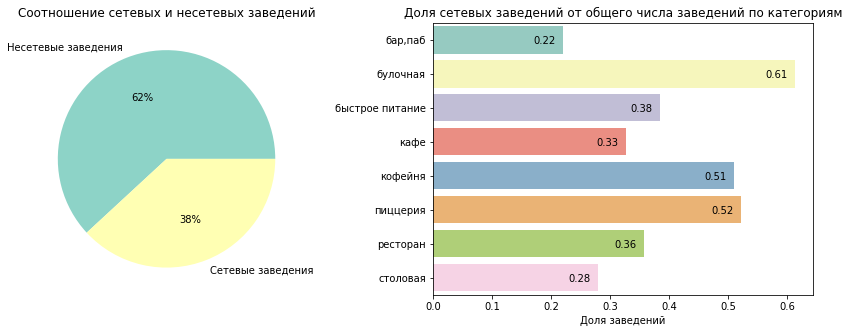

In [14]:
cm = catering.groupby('chain')['chain'].count()
cm1 = catering.loc[catering['chain'] == 1]
cm_part = cm1.pivot_table(index = 'category',values = 'name', aggfunc = {'count'}) / catering.pivot_table(index = 'category',values = 'name', aggfunc = {'count'})
cm_part = cm_part.reset_index()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

cm.plot(kind = 'pie', 
        labels = ['Несетевые заведения', 'Сетевые заведения'],
        ylabel = '', 
        colors = colors, 
        autopct='%.0f%%',
        ax = fig.axes[0],
        title = 'Соотношение сетевых и несетевых заведений')

h = sns.barplot(data = cm_part, 
            x = 'count', 
            y = 'category',
            ax = fig.axes[1],
            palette = colors)
h.set_xlabel('Доля заведений')
h.set_ylabel('')
h.set_title('Доля сетевых заведений от общего числа заведений по категориям')

# добавим максимальные значения на график
xi = 0
j = 0
for i in range(0,8):
    xi = cm_part['count'].iloc[i]
    ax[1].text(x = xi-0.05, y = 0.1 + j, s = f'{xi:.2f}')
    j+=1;

<a id = 'research_3_conc'></a>
**Вывод**

В Москве доля несетевых заведений выше, чем сетевых.

Булочные чаще других типов заведений делают сетевыми. Половина сетевых в категории кофеен и пиццерий.

Реже всего сетевыми становятся бары и столовые.

<a id = 'research_4'></a>
## Исследование 4

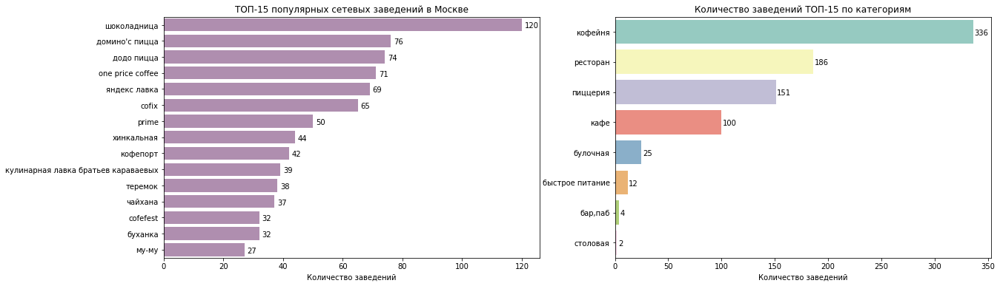

In [15]:
# найдем топ-15 сетевых заведений в Москве по количеству этих заведений
cn_chain = catering.loc[catering['chain'] == 1]
cn = cn_chain.pivot_table(index = 'name', values = 'category', aggfunc = {'count'}). \
         sort_values(by = 'count', ascending = False). \
         head(15). \
         reset_index()

# найдем категории этих топ-15 заведений
cnc = cn_chain.loc[cn_chain['name'].isin(cn['name'])]
cnc_group = cnc.pivot_table(index = 'category', values = 'name', aggfunc = {'count'}). \
          sort_values(by = 'count', ascending = False). \
          reset_index()

# построим графики
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
colors = sns.color_palette('Set3')

# первый график
g1 = sns.barplot(data = cn, 
            x = 'count', 
            y = 'name',
            ax = fig.axes[0],
            color = '#b588b5') # palette('Set3')
g1.set_xlabel('Количество заведений')
g1.set_ylabel('')
g1.set_title('ТОП-15 популярных сетевых заведений в Москве')
# добавим максимальные значения на график
xi = 0
j=0
for i in range(0,15):
    xi = cn['count'].iloc[i]
    ax[0].text(x = xi+1, y = 0.2+j, s = f'{xi}')
    j+=1

# второй график
g2 = sns.barplot(data = cnc_group, 
            x = 'count', 
            y = 'category',
            ax = fig.axes[1],
            palette = 'Set3')
g2.set_xlabel('Количество заведений')
g2.set_ylabel('')
g2.set_title('Количество заведений ТОП-15 по категориям')
# добавим максимальные значения на график
xi = 0
j=0
for i in range(0,8):
    xi = cnc_group['count'].iloc[i]
    ax[1].text(x = xi+1, y = 0.1+j, s = f'{xi}')
    j+=1

<a id = 'research_4_conc'></a>
**Вывод**

Больше всего в Москве заведений сети "Шоколадница" (120 заведений).

Чаще всего популярные сетевые заведения - это кофейни, рестораны, пиццерии и кафе (больше 100 объектов сети).

Меньше всего популярных сетевых заведений среди столовых, баров, точек быстрого питания и булочных.

<a id = 'research_5'></a>
## Исследование 5

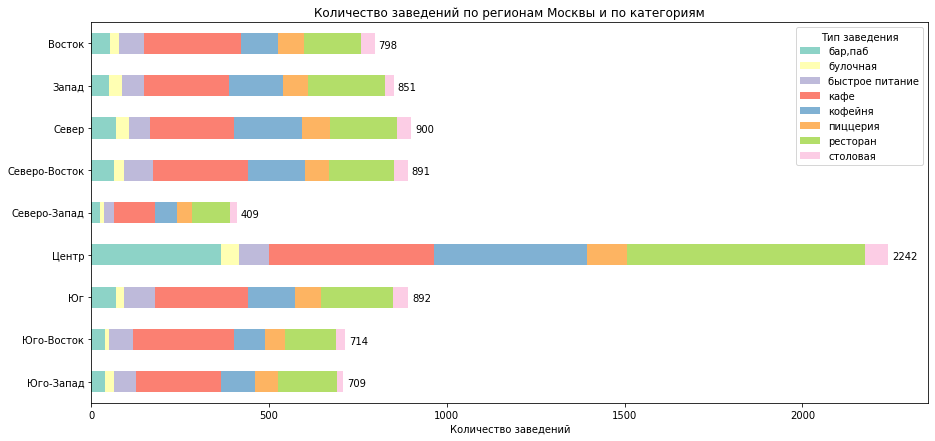

In [16]:
dc = catering.pivot_table(index = 'district_short', columns = 'category', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'district_short', ascending = False). \
                    reset_index()
# вспомогательный график для легенды
l = catering.pivot_table(index = 'category', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'category', ascending = True). \
                    reset_index()
# вспомогательный график для максимальных значений
u = catering.pivot_table(index = 'district_short', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'district_short', ascending = True). \
                    reset_index()


sns.set_palette('Set3')
dc.set_index('district_short'). \
          plot.barh(stacked=True,
                    figsize = (15,7))
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.title('Количество заведений по регионам Москвы и по категориям')
plt.legend(l['category'], title='Тип заведения');
# добавим максимальные значения на график
xi = 0
j=0
for i in range(0,9):
    xi = u['count'].iloc[i]
    plt.text(x = xi + 10, y = 7.9 - j, s = f'{xi}')
    j+=1


<a id = 'research_5_conc'></a>
**Вывод**

Заведений общепита больше всего в Центральном районе, что вполне логично. Причем по всем категориям заведений Центральный район лидирует. 

Другие районы приблизительно равномерно заполнены точками общепита.

Меньше всего заведений общепита в Северо-Западном районе - примерно в два раза меньше чем в любом другом районе (кроме Центрального района). 

<a id = 'research_6'></a>
## Исследование 6

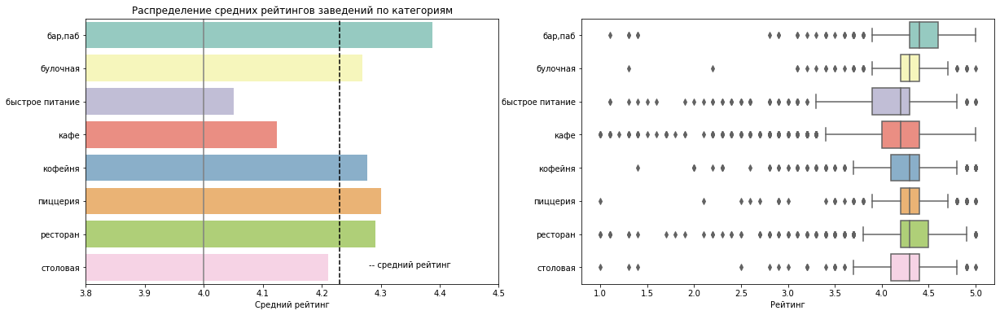

In [17]:
rc = catering.pivot_table(index = 'category', values = 'rating', aggfunc = {'mean'}). \
                    reset_index()
rating_mean = catering['rating'].mean()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))

# первый график
g1 = sns.barplot(data = rc, 
            x = 'mean', 
            y = 'category',
            palette = 'Set3',
            ax = fig.axes[0])
ax[0].axvline(rating_mean, color = 'k', linestyle = '--')
ax[0].axvline(4, color = 'grey', linestyle = '-')
g1.set_xlabel('Средний рейтинг')
g1.set_ylabel('')
g1.set_xlim(3.8,4.5)
g1.text(4.28,7,'-- средний рейтинг')
g1.set_title('Распределение средних рейтингов заведений по категориям')

# второй график
g2 = sns.boxplot(data = catering.sort_values(by = 'category'), 
                 y = 'category', 
                 x = 'rating', 
                 ax = fig.axes[1])
g2.set_xlabel('Рейтинг')
g2.set_ylabel('');

<a id = 'research_6_conc'></a>
**Вывод**

Видно, что средние рейтинги заведений отличаются не сильно. Все выше 4 баллов.

<a id = 'research_map'></a>
## Построение карты со средним рейтингом заведений

In [18]:
# задание карты Москвы по координатам центра
with open('/datasets/admin_level_geomap.geojson','r') as f:
    geo_json = json.load(f)
geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

In [19]:
# построение хороплета со средним рейтингом заведений каждого региона
rating_mean = catering.groupby('district', as_index=False)['rating'].agg('mean')

Choropleth(geo_data = geo,
           data = rating_mean,
           columns = ['district', 'rating'],
           key_on = 'feature.name',
           fill_color = 'GnBu',
           fill_opacity = 0.8,
           legend_name ='Средний рейтинг заведений общепита по районам Москвы').add_to(m)
m

In [20]:
# подготовка маркеров-кластеров
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

In [21]:
# нанесение кластеров на карту
catering.apply(create_clusters, axis = 1)
m

<a id = 'research_map_conc'></a>
**Вывод**

По карте видно, что самый высокий средний рейтинг в Центральном районе Москвы, а самый низкий - в Юго-Восточном районе.


<a id = 'research_7'></a>
## Исследование 7

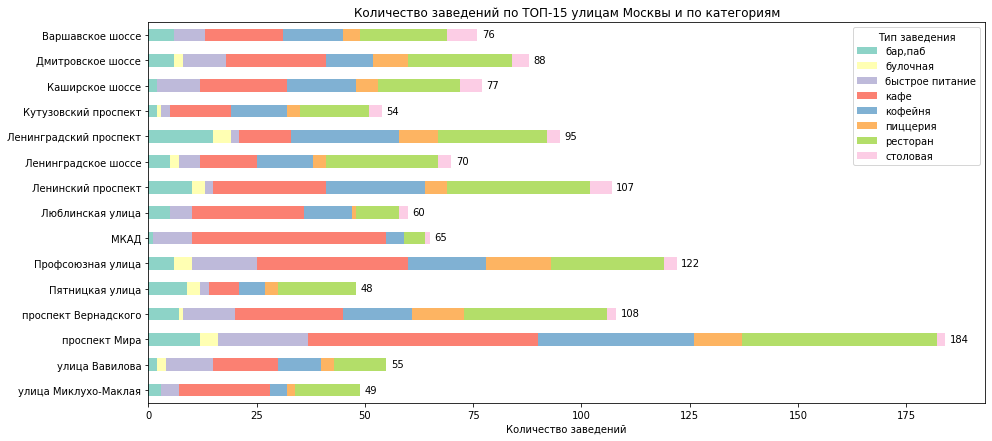

In [22]:
#сводная таблица по улицами и общему количеству заведений на них (топ-15)
sn = catering.pivot_table(index = 'street', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'count', ascending = False). \
                    reset_index().head(15)

#создаю датасет с данными только на улицах из топ-15
sn1 = catering.loc[catering['street'].isin(sn['street'])]

#сводная таблица по улицам из топ-15, разбитая по типам заведений и с количеством таких заведений на улице
sn2 = sn1.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'street', ascending = False). \
                    reset_index().head(15)

#вспомогательная сводная таблица для легенды
l = catering.pivot_table(index = 'category', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'category', ascending = True). \
                    reset_index()
# вспомогательный график для максимальных значений
u = sn1.pivot_table(index = 'street', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'street', ascending = True). \
                    reset_index()

#построение графика с наложением
sns.set_palette('Set3')
sn2.set_index('street'). \
          plot.barh(stacked=True,
                    figsize = (15,7))
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.title('Количество заведений по ТОП-15 улицам Москвы и по категориям')
plt.legend(l['category'], title='Тип заведения');

# добавим максимальные значения на график
xi = 0
j=0
for i in range(0,15):
    xi = u['count'].iloc[i]
    plt.text(x = xi + 1, y = 13.9 - j, s = f'{xi}')
    j+=1

In [23]:
# сводная таблица по улицам Москвы и количеству заведений на этих улицах
s1 = catering.pivot_table(index = 'street', values = 'name', aggfunc = {'count'}). \
                     reset_index()
# отберем только те улицы, где число заведений равно 1
s2 = s1.loc[s1['count'] == 1].reset_index(drop = True)
# создадим датасет с информацией о заведениях, которых на улице 1 штука 
s3 = catering.loc[catering['street'].isin(s2['street'])]

# на карте пометим маркерами заведения, которых на улице 1 штука
m2 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')
folium.GeoJson(geo).add_to(m2)

marker_cluster = MarkerCluster().add_to(m2)
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)
    
s3.apply(create_clusters, axis = 1)
m2

In [24]:
s3.pivot_table(index ='category', values = 'name', aggfunc = {'count'}).sort_values(by = 'count', ascending = False).reset_index()


,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [25]:
print(f'Количество улиц в Москве с одним заведением: {s3.shape[0]}')


Количество улиц в Москве с одним заведением: 458


<a id = 'research_7_conc'></a>
**Вывод**

Наибольшее количество заведений общепита находится на проспекте Мира (184 заведения). На этой улице много кафе, кофеен и рестранов.

Из ТОП-15 улиц меньше всего заведений на Пятницкой улице (48 заведений), но большую часть из всех занимают рестораны.

В Москве 458 улиц, где всего одно заведение. Такие улицы расположены в разных районах Москвы. Больше всего таких заведений среди кафе, ресторанов и кофеен.

<a id = 'research_8'></a>
## Исследование 8

In [26]:
# строим карту Москвы
m1 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')
# вычисляем медианное значение средних чеков по районам
bill_median = catering.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

Choropleth(geo_data = geo,
           data = bill_median,
           columns = ['district', 'middle_avg_bill'],
           key_on = 'feature.name',
           fill_color = 'YlGn',
           fill_opacity = 0.8,
           legend_name ='Медианные значения средних чеков заведений по районам Москвы').add_to(m1)
m1

In [27]:
bill_median.sort_values(by = 'middle_avg_bill', ascending = False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


<a id = 'research_8_conc'></a>
**Вывод**

Самые высокие цены в заведениях Центрального и Западного районов. Медиана средних чеков этих районов - 1000.

Самые недорогие заведения в Северо-Восточном, Южном и Юго-Восточном районах. Медиана средних чеков этих районов - 450-500.

<a id = 'conclusion_ad'></a>
## Общий вывод

* В Москве более 8400 заведений общепита. Из них 28% - это кафе, 24% - рестораны и 17% - кофейни. Остальных типов заведений - 31%.

* Центральный округ стал главным районом, где разместилось больше всего разнообразных заведений общепита (2242 точки). А меньше всего заведений в Северо-Западном районе Москвы (409 точек). В остальных округах таких заведений примерно равное количество: от 709 до 900 точек.

* Наибольшее число заведений общепита расположено на проспекте Мира (184 точки). Наравне с этим в городе есть немало улиц, на которых расположено всего одно заведение общественного питания.

* Среди точек общепита есть как сетевые (38%), так и несетевые заведения (62%). Среди сетевых основные типы заведений - это кафе (24%), рестораны (23%) и кофейни (22%). Чаще других сетевыми становятся булочные, а реже других бары и столовые. Больше всего точек по городу имеет сеть "Шоколадница" (120 точек).

* Самые высокие цены в заведениях Центрального и Западного районов, а самые демократичные цены в Северо-Восточном, Южном и Юго-Восточном районах.

* В среднем посадочных мест в заведениях от 50 (булочные) до 86 (рестораны).

* Что касается средних рейтингов заведений, то они отличаются несильно и все выше 4 из 5 баллов.

* Таких типов заведений, как бары, пиццерии, столовые, булочные и точки быстрого питания, в Москве немного. Среди сетевых заведений их тоже мало. 

<a id = 'open_coffee'></a>
# 4. Детализация исследования: открытие кофейни

In [28]:
# соберем датасет с информацией о всех кофейнях
coffee = catering.loc[catering['category'] == 'кофейня']

print(f'Количество кофеен в Москве: {coffee.shape[0]}')


Количество кофеен в Москве: 1413


In [29]:
#Количество кофеен по районам
c_count = coffee.pivot_table(index = 'district_short', values = 'name', aggfunc = {'count'}). \
                    sort_values(by = 'district_short').reset_index()

#Средний рейтинг кофеен по районам
c_rating = coffee.pivot_table(index = 'district_short', values = 'rating', aggfunc = {'mean'}). \
                    sort_values(by = 'district_short').reset_index()
rating_mean = coffee['rating'].mean() # средний рейтинг кофеен по Москве

#Средняя стоимость чашки капучино по районам
c_price = coffee.pivot_table(index = 'district_short', values = 'middle_coffee_cup', aggfunc = {'mean'}). \
                    sort_values(by = 'district_short').reset_index()
price_mean = coffee['middle_coffee_cup'].mean() # средняя стоимость чашки капучино по Москве

# Круглосуточные или нет кофейни
c_hours =  coffee.pivot_table(index = 'is_24_7', values = 'name', aggfunc = {'count'}). \
                    reset_index()

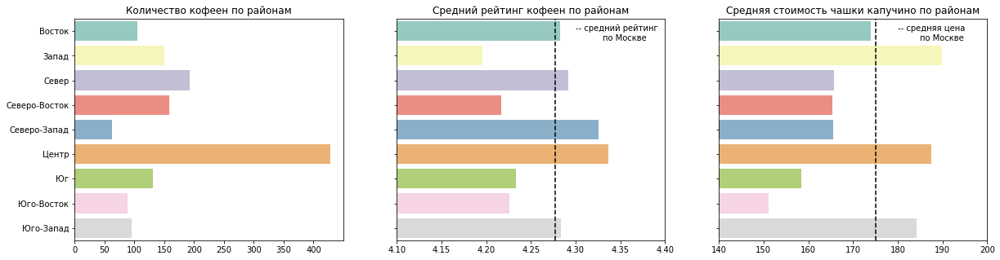

In [30]:
fig, ax = plt.subplots(1,3,figsize = (20,5))

# первый график
sns.barplot(data = c_count,
           x = 'count', y = 'district_short', ax = ax[0])
ax[0].set(title = 'Количество кофеен по районам', xlabel = '', ylabel = '')

# Второй график
sns.barplot(data = c_rating,
           x = 'mean', y = 'district_short', ax = ax[1])
ax[1].axvline(x = rating_mean, color = 'k', linestyle = '--')
ax[1].text(4.3,0,'-- средний рейтинг')
ax[1].text(4.33,0.4,'по Москве')
ax[1].set_xlim(4.1,4.4)
ax[1].set(title = 'Средний рейтинг кофеен по районам', xlabel = '', ylabel = '', yticklabels = [])

# Третий график
sns.barplot(data = c_price,
           x = 'mean', y = 'district_short', ax = ax[2])
ax[2].axvline(x = price_mean, color = 'k', linestyle = '--')
ax[2].text(180,0,'-- средняя цена')
ax[2].text(185,0.4,'по Москве')
ax[2].set_xlim(140,200)
ax[2].set(title = 'Средняя стоимость чашки капучино по районам', xlabel = '', ylabel = '', yticklabels = []);

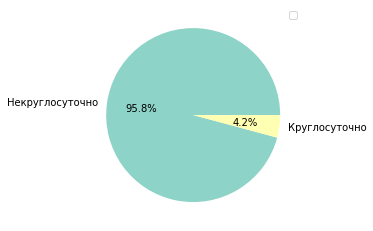

In [31]:
c_hours.plot(kind = 'pie', 
             y = 'count', 
             labels = ['Некруглосуточно','Круглосуточно'], 
             ylabel = '', 
             autopct = '%1.1f%%'
             )
plt.legend('');

**Промежуточный вывод:**

Для сужения выбора места для кофейни, я решила выбрать район Северо-Восточный и в нём провести еще исследования для локализации точки.

Свой выбор Северо-Восточного округа я объясню следующим образом:

* Выбираю район, где немного кофеен. Если в районе немного кофеен, то еще одна точка будет вполне оправдана и сможет быть рентабельной.

* Выбираю район со средним рейтингом кофеен ниже среднего. Если средний рейтинг кофеен достаточно низок, то у новой кофейне есть хороший шанс составить конкуренцию и даже выйти в лидеры. Конкурировать с кофейнями с высоким рейтингом новой кофейне очень сложно, ведь люди будут доверять уже проверенным и качественным местам.

* Выбираю район со средней стоимостью чашки капучино ниже среднего, но не самую низкую. Высокой ценой на чашку кофе сложно привлечь новых клиентов. Возможно в районах, где эта стоимость достаточно высока, большие накладные расходы, поэтому новому бизнесу будет сложно и долго выходить на окупаемость. Но если выбрать район с самой низкой средней ценой за чашку кофе, то для начального привлечения клиентов, будет не выгодно уменьшать цену.

Рассмотрев внимательно графики и приняв во внимание описанные соображения, я остановила свой выбор на Северо-Восточном районе.

In [32]:
# датасет с данными о кофейнях в районе Северо-Восток
c_NE = coffee.loc[coffee['district_short'] == 'Северо-Восток']
print(f'Количество кофеен в Северо-Восточном районе: {c_NE.shape[0]}')

Количество кофеен в Северо-Восточном районе: 159


In [33]:
# Найдем средний рейтинг по району
# Создадим два датасета: в одном рейтинг ниже среднего, в другом - выше среднего
rating_mean_NE = c_NE['rating'].mean()
c_NE_below = c_NE.loc[c_NE['rating'] < rating_mean_NE]
c_NE_above = c_NE.loc[c_NE['rating'] >= rating_mean_NE]


In [34]:
# Создаем карту
m3 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron', zoom_start = 11)
folium.GeoJson(geo).add_to(m3)

In [35]:
# Наносим маркеры - красные, там, где рейтинг ниже среднего, зеленые, где рейтинг выше среднего
def create_marker1(row):
    Marker([row['lat'], row['lng']], icon=folium.Icon(color="green"),
           popup=f"{row['name']} {row['rating']}"
    ).add_to(m3)
    
def create_marker2(row):
    Marker([row['lat'], row['lng']], icon=folium.Icon(color="red"),
           popup=f"{row['name']} {row['rating']}"
    ).add_to(m3) 
    
c_NE_above.apply(create_marker1, axis = 1)
c_NE_below.apply(create_marker2, axis = 1)
m3

<a id = 'conclusion_coffee'></a>
**Вывод:**

На карте нанесены все кофейни из датасета, расположенные в Северо-Восточном районе Москвы.
Красным цветом обозначены кофейни с рейтингом ниже среднего по району. Зеленым - с рейтингом выше среднего по району.

Видно, что на карте есть места, где вообще нет кофеен. Но я бы не рекомендовала размещать заведение в этих пустых местах, ведь привлечь туда клиентов будет довольно сложно.

Я бы рекомендовала поискать места для кофейни недалеко от тех мест, где кофейни уже есть, ведь клиенты уже знакомы с этими местами и привыкли, что там есть кофейни. 

Но еще я бы рекомендовала ориентироваться на краные маркеры, т.к. открыв заведение недалеко от кофейни с довольно низким рейтингом, есть возможность стать конкурентами этим уже открытым кофейням.

Я бы рекомендовала выбрать места с большой проходимостью – парки, достопримечательности, торговые центры

Исходя из всего вышеперечисленного, рекомендую открыть кофейню в районе ВДНХ, Останкинской телебашни, Звездного бульвара.


<a id = 'power_point'></a>
# Презентация

Презентация: https://disk.yandex.ru/i/tH6lrVuM4b2m6g (обновленный вариант)